# Plotting Sentinel 5P Data

## Loading Data

In [1]:
import geopandas
import s5a

import warnings
warnings.filterwarnings('ignore')

# Read world map
world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))

# Read file
data = s5a.load_ncfile(
    'data/S5P_OFFL_L2__NO2____/S5P_OFFL_L2__NO2____20191231T025317_20191231T043447_11474_01_010302_20200101T192226.nc'
)

# Reduce points
data = s5a.filter_by_quality(data)
data = s5a.point_to_h3(data, resolution=5)
data = s5a.aggregate_h3(data)
data = s5a.h3_to_point(data)

# Create geopandas dataframe
geometry = geopandas.points_from_xy(data.longitude, data.latitude)
data = geopandas.GeoDataFrame(data, geometry=geometry, crs={'init' :'epsg:4326'})

# Projection change
robinson_projection = '+a=6378137.0 +proj=robin +lon_0=0 +no_defs'
world = world.to_crs(robinson_projection)
data = data.to_crs(robinson_projection)

## Plotting the File

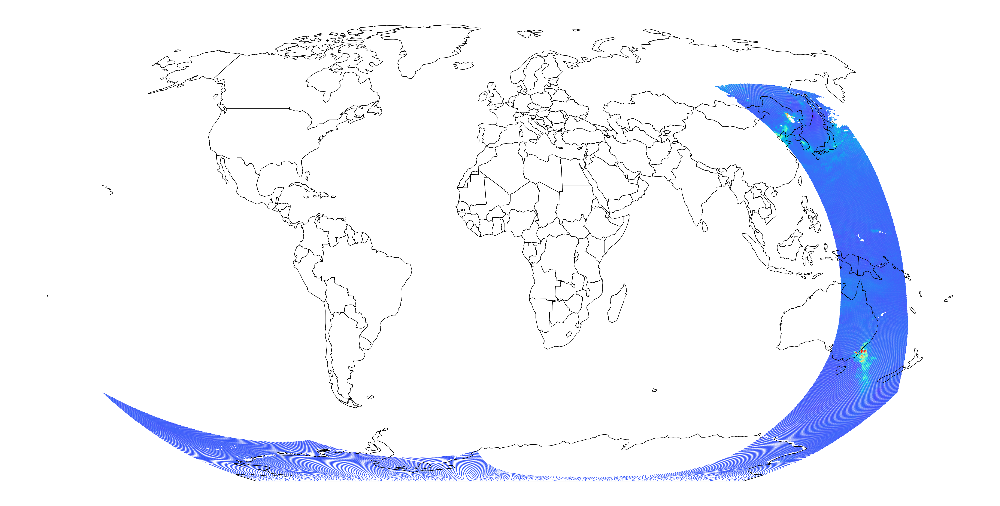

In [2]:
import matplotlib.pyplot as plt

# Define base of the plot.
fig, ax = plt.subplots(1, 1, figsize=(60, 60), dpi=100)
# Disable the axes
ax.set_axis_off()
# Plot the data
data.plot(
    column='value',  # Column defining the color
    cmap='rainbow',  # Colormap
    marker='H',  # marker layout. Here a Hexagon.
    markersize=1,
    ax=ax,  # Base
    vmax=0.0005,  # Used as max for normalize luminance data
)

# Plot the boundary of the countries on top
world.geometry.boundary.plot(color=None, edgecolor='black', ax=ax)

## Plotting multiple Files

In [3]:
import glob

import pandas


# Read in all files
data = []
for filename in glob.glob('data/S5P_OFFL_L2__NO2____/*.nc'):
    data.append(
        s5a.filter_by_quality(
            s5a.load_ncfile(filename)))

# Combine points
data = pandas.concat(data, ignore_index=True)

# Reduce points
data = s5a.point_to_h3(data, resolution=5)
data = s5a.aggregate_h3(data)
data = s5a.h3_to_point(data)

# Create geopandas dataframe
geometry = geopandas.points_from_xy(data.longitude, data.latitude)
data = geopandas.GeoDataFrame(data, geometry=geometry, crs={'init' :'epsg:4326'})

# Projection change
data = data.to_crs(robinson_projection)

Now we plot this data the same we way than before.

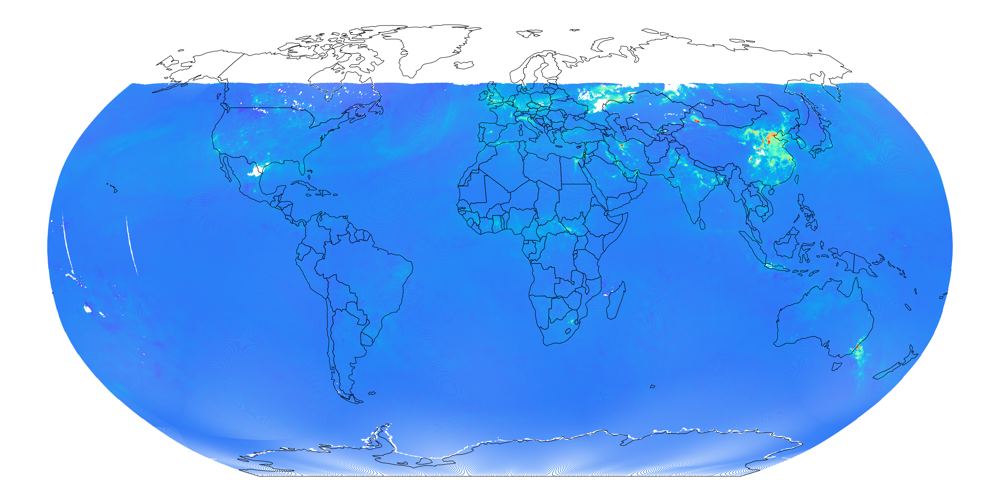

In [4]:
import matplotlib.pyplot as plt

# Define base of the plot.
fig, ax = plt.subplots(1, 1, figsize=(60, 60), dpi=100)
# Disable the axes
ax.set_axis_off()
# Plot the data
data.plot(
    column='value',  # Column defining the color
    cmap='rainbow',  # Colormap
    marker='H',  # marker layout. Here a Hexagon.
    markersize=1,
    ax=ax,  # Base
    vmax=0.0005,  # Used as max for normalize luminance data
)

# Plot the boundary of the countries on top
world.geometry.boundary.plot(color=None, edgecolor='black', ax=ax)